This code utilizes the CSV dataset files containing data from 2012 to 2022 on median house value, median household income, racial demographics, and educational attainment for all census tracts in the New Jersey Mercer County area. GeoJSON data is fetched from TIGERWeb API for mapping.

In [ ]:
!pip install geopandas matplotlib

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import requests
import geopandas as gpd

# Ensure Directory Exists
# Define the directory path
dir = "/path/to/your/data/"

# Create the directory if it does not exist
os.makedirs(dir, exist_ok=True)
print(f"Directory created or already exists: {dir}")


# Fetch GeoJSON Data from TIGERWeb API
# API URL for Mercer County Census Tracts
url = "https://tigerweb.geo.census.gov/arcgis/rest/services/TIGERweb/Tracts_Blocks/MapServer/2/query"
params = {
    "where": "STATE='34' AND COUNTY='021'",  # New Jersey and Mercer County --- change these codes for other states/counties
    "outFields": "*", # All fields
    "outSR": "4326", # WGS 84 coordinate system
    "f": "geojson" # Request GeoJSON format
}

# Send GET request to the API
response = requests.get(url, params=params)#, timeout=30)

# Check if the response is valid
if response.status_code == 200:
    print("GeoJSON data fetched successfully.")
else:
    print(f"Failed to fetch data. Status code: {response.status_code}")
    response.raise_for_status()

Directory created or already exists: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/
GeoJSON data fetched successfully.


In [ ]:
# Save GeoJSON Data to File
geojson_path = os.path.join(dir, "Mercer_County_Census_Tracts.geojson") # Change to the county you are studying
with open(geojson_path, "w") as f:
    f.write(response.text)
print(f"GeoJSON file saved at: {geojson_path}")

# Load GeoJSON into GeoPandas
gdf = gpd.read_file(geojson_path)
print("First few rows of the GeoDataFrame:")
print(gdf.head())



Directory created or already exists: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/
GeoJSON data fetched successfully.
GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts.geojson
First few rows of the GeoDataFrame:
               OID STATE COUNTY   TRACT BLKGRP BLOCK SUFFIX            GEOID  \
0  210701004616350    34    021  000100      1  1000   None  340210001001000   
1  210701004616583    34    021  000100      1  1001   None  340210001001001   
2  210701004612468    34    021  000100      1  1002   None  340210001001002   
3  210701004616438    34    021  000100      1  1003   None  340210001001003   
4  210701004615101    34    021  000100      1  1004   None  340210001001004   

  LWBLKTYP UR  ... LSADC FUNCSTAT       CENTLON      CENTLAT      INTPTLON  \
0        L  U  ...    BK        S  -074.7542107  +40.2046348  -074.7542107   
1    

<Axes: >

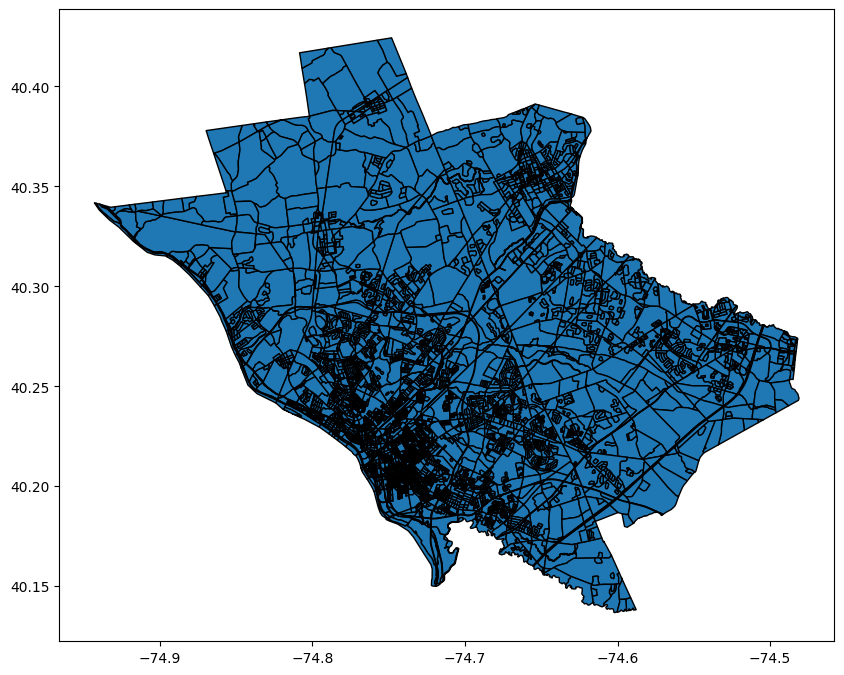

In [ ]:
# Plot the GeoJSON data as a test (Basic Map)
gdf.plot(figsize=(10, 10), edgecolor="black")

# Merging GeoJSON and Census Data

In [ ]:
"""
Median Household Income and Median House Value Data
"""

import geopandas as gpd
import pandas as pd

# File paths --- change these accordingly
geojson_path = dir + "Mercer_County_Census_Tracts.geojson"
csv_path = dir + "median_household_income_and_median_house_value.csv"
output_geojson_path = dir + "Mercer_County_Census_Tracts_with_Income_and_Value.geojson"

# Load GeoJSON
gdf = gpd.read_file(geojson_path)

# Debug: Print GeoJSON columns
print("GeoJSON Columns:", gdf.columns)

# Correct column names based on your GeoJSON structure
state_col = "STATE"  # State identifier
county_col = "COUNTY"  # County identifier
tract_col = "TRACT"  # Tract identifier

# Create Unique_ID from STATE, COUNTY, and TRACT columns
gdf['Unique_ID'] = gdf[state_col] + gdf[county_col] + gdf[tract_col]

# Load CSV data
data = pd.read_csv(csv_path)

# Ensure Unique_ID is a string in both datasets
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)

# Merge GeoJSON and CSV data
merged_gdf = gdf.merge(data, on='Unique_ID', how='left')

# Save the merged GeoJSON
merged_gdf.to_file(output_geojson_path, driver="GeoJSON")
print(f"Merged GeoJSON file saved at: {output_geojson_path}")

GeoJSON Columns: Index(['OID', 'STATE', 'COUNTY', 'TRACT', 'BLKGRP', 'BLOCK', 'SUFFIX', 'GEOID',
       'LWBLKTYP', 'UR', 'AREAWATER', 'AREALAND', 'MTFCC', 'NAME', 'BASENAME',
       'LSADC', 'FUNCSTAT', 'CENTLON', 'CENTLAT', 'INTPTLON', 'INTPTLAT',
       'HU100', 'POP100', 'OBJECTID', 'geometry'],
      dtype='object')
Merged GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts_with_Income_and_Value.geojson


In [ ]:
"""
Future Predicted House Value Data
"""

import geopandas as gpd
import pandas as pd

# File paths
geojson_path = dir + "Mercer_County_Census_Tracts.geojson"
csv_path = dir + "future_predicted_house_values_nn.csv"
output_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value.geojson"

state_fips = "34"
county_fips = "021"

# Load GeoJSON
gdf = gpd.read_file(geojson_path)

# Debug: Print GeoJSON columns

# Correct column names based on your GeoJSON structure
state_col = "STATE"  # State identifier
county_col = "COUNTY"  # County identifier
tract_col = "TRACT"  # Tract identifier

# Create Unique_ID from STATE, COUNTY, and TRACT columns
gdf['Unique_ID'] = gdf[state_col] + gdf[county_col] + gdf[tract_col]


# Load CSV data
data = pd.read_csv(csv_path)

# Add Unique_ID column using "State FIPS" + "County FIPS" + "Census_Tract"
# GeoJSON census tract IDs are 6 characters long
# e.g. census tract 4200 is stored as "004200"
# zfill pads string with leading zeroes
data['Unique_ID'] = state_fips + county_fips + data['Census_Tract'].astype(str).str.zfill(6)

# Ensure Unique_ID is a string in both datasets
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)

# Merge GeoJSON and CSV data
merged_gdf = gdf.merge(data, on='Unique_ID', how='left')

# Save the merged GeoJSON
merged_gdf.to_file(output_geojson_path, driver="GeoJSON")
print(f"Merged GeoJSON file saved at: {output_geojson_path}")
print(data.head())
print(gdf.head())

Merged GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts_with_Future_House_Value.geojson
   Census_Tract  Predicted_House_Value_2023  Predicted_House_Value_2024  \
0           100                   121470.00                  124457.620   
1           200                   138458.36                  153243.030   
2           300                   116860.65                  119347.164   
3           400                    91977.30                   93837.305   
4           500                    85553.90                   95339.770   

   Predicted_House_Value_2025    Unique_ID  
0                   127743.29  34021000100  
1                   165759.62  34021000200  
2                   121281.78  34021000300  
3                    95181.06  34021000400  
4                   102091.17  34021000500  
               OID STATE COUNTY   TRACT BLKGRP BLOCK SUFFIX            GEOID  \
0  21070100461

In [ ]:
"""
Future Predicted House Value Data
"""

import geopandas as gpd
import pandas as pd

# File paths
geojson_path = dir + "Mercer_County_Census_Tracts.geojson"
csv_path = dir + "future_predicted_house_values_nn_linear_trend.csv"
output_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value_Linear_Trend.geojson"

state_fips = "34"
county_fips = "021"

# Load GeoJSON
gdf = gpd.read_file(geojson_path)

# Debug: Print GeoJSON columns

# Correct column names based on your GeoJSON structure
state_col = "STATE"  # State identifier
county_col = "COUNTY"  # County identifier
tract_col = "TRACT"  # Tract identifier

# Create Unique_ID from STATE, COUNTY, and TRACT columns
gdf['Unique_ID'] = gdf[state_col] + gdf[county_col] + gdf[tract_col]


# Load CSV data
data = pd.read_csv(csv_path)

# Add Unique_ID column using "State FIPS" + "County FIPS" + "Census_Tract"
# GeoJSON census tract IDs are 6 characters long
# e.g. census tract 4200 is stored as "004200"
# zfill pads string with leading zeroes
data['Unique_ID'] = state_fips + county_fips + data['Census_Tract'].astype(str).str.zfill(6)

# Ensure Unique_ID is a string in both datasets
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)

# Merge GeoJSON and CSV data
merged_gdf = gdf.merge(data, on='Unique_ID', how='left')

# Save the merged GeoJSON
merged_gdf.to_file(output_geojson_path, driver="GeoJSON")
print(f"Merged GeoJSON file saved at: {output_geojson_path}")
print(data.head())
print(gdf.head())

Merged GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts_with_Future_House_Value_Linear_Trend.geojson
   Census_Tract  Predicted_House_Value_2023  Predicted_House_Value_2024  \
0           100                   116124.41                  113466.720   
1           200                   135967.69                  150284.900   
2           300                   105879.71                  101741.460   
3           400                    78144.06                   71431.690   
4           500                    73599.74                   75536.805   

   Predicted_House_Value_2025    Unique_ID  
0                  110184.590  34021000100  
1                  165316.020  34021000200  
2                   99784.055  34021000300  
3                   66775.730  34021000400  
4                   76867.484  34021000500  
               OID STATE COUNTY   TRACT BLKGRP BLOCK SUFFIX            GEOID  \
0

In [ ]:
"""
Race Population Data
"""

import geopandas as gpd
import pandas as pd

# File paths
geojson_path = dir + "Mercer_County_Census_Tracts.geojson"
csv_path = dir + "race_populations.csv"
output_geojson_path = dir + "Mercer_County_Census_Tracts_with_White_Population.geojson"

# Load GeoJSON
gdf = gpd.read_file(geojson_path)

# Debug: Print GeoJSON columns
print("GeoJSON Columns:", gdf.columns)

# Correct column names based on your GeoJSON structure
state_col = "STATE"  # State identifier
county_col = "COUNTY"  # County identifier
tract_col = "TRACT"  # Tract identifier

# Create Unique_ID from STATE, COUNTY, and TRACT columns
gdf['Unique_ID'] = gdf[state_col] + gdf[county_col] + gdf[tract_col]

# Load CSV data
data = pd.read_csv(csv_path)

# Ensure Unique_ID is a string in both datasets
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)

# Merge GeoJSON and CSV data
merged_gdf = gdf.merge(data, on='Unique_ID', how='left')

# Save the merged GeoJSON
merged_gdf.to_file(output_geojson_path, driver="GeoJSON")
print(f"Merged GeoJSON file saved at: {output_geojson_path}")

GeoJSON Columns: Index(['OID', 'STATE', 'COUNTY', 'TRACT', 'BLKGRP', 'BLOCK', 'SUFFIX', 'GEOID',
       'LWBLKTYP', 'UR', 'AREAWATER', 'AREALAND', 'MTFCC', 'NAME', 'BASENAME',
       'LSADC', 'FUNCSTAT', 'CENTLON', 'CENTLAT', 'INTPTLON', 'INTPTLAT',
       'HU100', 'POP100', 'OBJECTID', 'geometry'],
      dtype='object')
Merged GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts_with_White_Population.geojson


In [ ]:
"""
Race Population Percentage Data
"""

import geopandas as gpd
import pandas as pd

# File paths
geojson_path = dir + "Mercer_County_Census_Tracts.geojson"
csv_path = dir + "race_populations_percentages.csv"
output_geojson_path = dir + "Mercer_County_Census_Tracts_with_White_Population_Percentage.geojson"

# Load GeoJSON
gdf = gpd.read_file(geojson_path)

# Debug: Print GeoJSON columns
print("GeoJSON Columns:", gdf.columns)

# Correct column names based on your GeoJSON structure
state_col = "STATE"  # State identifier
county_col = "COUNTY"  # County identifier
tract_col = "TRACT"  # Tract identifier

# Create Unique_ID from STATE, COUNTY, and TRACT columns
gdf['Unique_ID'] = gdf[state_col] + gdf[county_col] + gdf[tract_col]

# Load CSV data
data = pd.read_csv(csv_path)

# Ensure Unique_ID is a string in both datasets
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)

# Merge GeoJSON and CSV data
merged_gdf = gdf.merge(data, on='Unique_ID', how='left')

# Save the merged GeoJSON
merged_gdf.to_file(output_geojson_path, driver="GeoJSON")
print(f"Merged GeoJSON file saved at: {output_geojson_path}")

GeoJSON Columns: Index(['OID', 'STATE', 'COUNTY', 'TRACT', 'BLKGRP', 'BLOCK', 'SUFFIX', 'GEOID',
       'LWBLKTYP', 'UR', 'AREAWATER', 'AREALAND', 'MTFCC', 'NAME', 'BASENAME',
       'LSADC', 'FUNCSTAT', 'CENTLON', 'CENTLAT', 'INTPTLON', 'INTPTLAT',
       'HU100', 'POP100', 'OBJECTID', 'geometry'],
      dtype='object')
Merged GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts_with_White_Population_Percentage.geojson


In [ ]:
"""
Educational Attainment Data
"""

import geopandas as gpd
import pandas as pd

# File paths
geojson_path = dir + "Mercer_County_Census_Tracts.geojson"
csv_path = dir + "educational_attainment.csv"
output_geojson_path = dir + "Mercer_County_Census_Tracts_with_Educational_Attainment.geojson"

# Load GeoJSON
gdf = gpd.read_file(geojson_path)

# Debug: Print GeoJSON columns
print("GeoJSON Columns:", gdf.columns)

# Correct column names based on your GeoJSON structure
state_col = "STATE"  # State identifier
county_col = "COUNTY"  # County identifier
tract_col = "TRACT"  # Tract identifier

# Create Unique_ID from STATE, COUNTY, and TRACT columns
gdf['Unique_ID'] = gdf[state_col] + gdf[county_col] + gdf[tract_col]

# Load CSV data
data = pd.read_csv(csv_path)

# Ensure Unique_ID is a string in both datasets
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)

# Merge GeoJSON and CSV data
merged_gdf = gdf.merge(data, on='Unique_ID', how='left')

# Save the merged GeoJSON
merged_gdf.to_file(output_geojson_path, driver="GeoJSON")
print(f"Merged GeoJSON file saved at: {output_geojson_path}")

GeoJSON Columns: Index(['OID', 'STATE', 'COUNTY', 'TRACT', 'BLKGRP', 'BLOCK', 'SUFFIX', 'GEOID',
       'LWBLKTYP', 'UR', 'AREAWATER', 'AREALAND', 'MTFCC', 'NAME', 'BASENAME',
       'LSADC', 'FUNCSTAT', 'CENTLON', 'CENTLAT', 'INTPTLON', 'INTPTLAT',
       'HU100', 'POP100', 'OBJECTID', 'geometry'],
      dtype='object')
Merged GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts_with_Educational_Attainment.geojson


In [ ]:
"""
Educational Attainment Percentage Data
"""

import geopandas as gpd
import pandas as pd

# File paths
geojson_path = dir + "Mercer_County_Census_Tracts.geojson"
csv_path = dir + "educational_attainment_percentages.csv"
output_geojson_path = dir + "Mercer_County_Census_Tracts_with_Educational_Attainment_Percentage.geojson"

# Load GeoJSON
gdf = gpd.read_file(geojson_path)

# Debug: Print GeoJSON columns
print("GeoJSON Columns:", gdf.columns)

# Correct column names based on your GeoJSON structure
state_col = "STATE"  # State identifier
county_col = "COUNTY"  # County identifier
tract_col = "TRACT"  # Tract identifier

# Create Unique_ID from STATE, COUNTY, and TRACT columns
gdf['Unique_ID'] = gdf[state_col] + gdf[county_col] + gdf[tract_col]

# Load CSV data
data = pd.read_csv(csv_path)

# Ensure Unique_ID is a string in both datasets
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)

# Merge GeoJSON and CSV data
merged_gdf = gdf.merge(data, on='Unique_ID', how='left')

# Save the merged GeoJSON
merged_gdf.to_file(output_geojson_path, driver="GeoJSON")
print(f"Merged GeoJSON file saved at: {output_geojson_path}")

GeoJSON Columns: Index(['OID', 'STATE', 'COUNTY', 'TRACT', 'BLKGRP', 'BLOCK', 'SUFFIX', 'GEOID',
       'LWBLKTYP', 'UR', 'AREAWATER', 'AREALAND', 'MTFCC', 'NAME', 'BASENAME',
       'LSADC', 'FUNCSTAT', 'CENTLON', 'CENTLAT', 'INTPTLON', 'INTPTLAT',
       'HU100', 'POP100', 'OBJECTID', 'geometry'],
      dtype='object')
Merged GeoJSON file saved at: /content/drive/MyDrive/HousingWorkplace/NEW and IMPROVED Mercer County Housing Analysis/Assets/Mercer_County_Census_Tracts_with_Educational_Attainment_Percentage.geojson


# Mapping Current Data

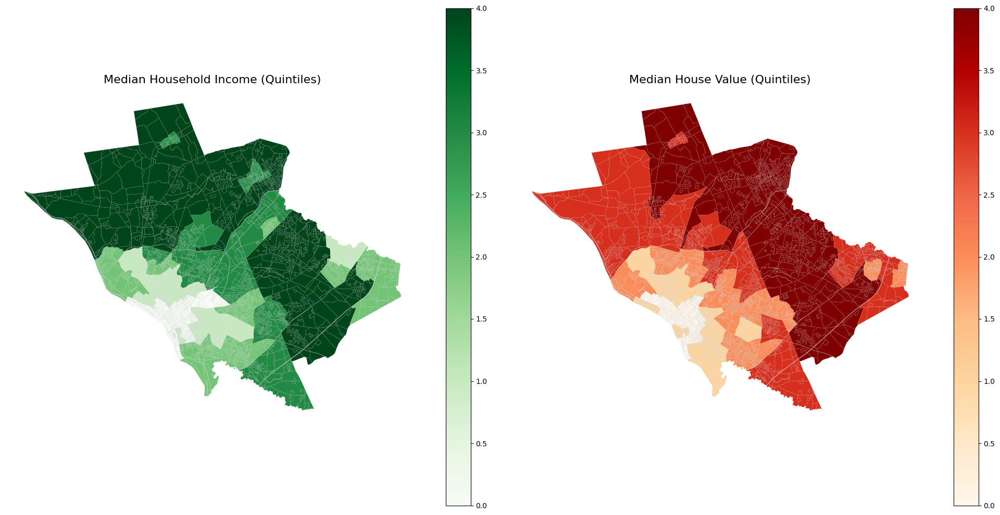

In [ ]:
#@title Median House Value and Median Household Income in Quintiles (2022)
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Income_and_Value.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Choose the columns to visualize
income_field = "Median_Household_Income_2022"
house_value_field = "Median_House_Value_2022"

# Create quantile-based classification for both metrics
# q is how many quantiles, 5 is used here to split into 5 quintiles
gdf['income_quantiles'] = pd.qcut(gdf[income_field], q=5, labels=False)
gdf['house_value_quantiles'] = pd.qcut(gdf[house_value_field], q=5, labels=False)

# Plot side-by-side maps
fig, axes = plt.subplots(1, 2, figsize=(20, 10), sharey=True)

# Plot Median Household Income
gdf.plot(
    column='income_quantiles',
    cmap="Greens",
    linewidth=0.1,
    edgecolor="0.8",
    ax=axes[0],
    legend=True
)
axes[0].set_title("Median Household Income (Quintiles)", fontsize=16)
axes[0].axis("off")

# Plot Median House Value
gdf.plot(
    column='house_value_quantiles',
    cmap="OrRd",
    linewidth=0.1,
    edgecolor="0.8",
    ax=axes[1],
    legend=True
)

axes[1].set_title("Median House Value (Quintiles)", fontsize=16)
axes[1].axis("off")

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


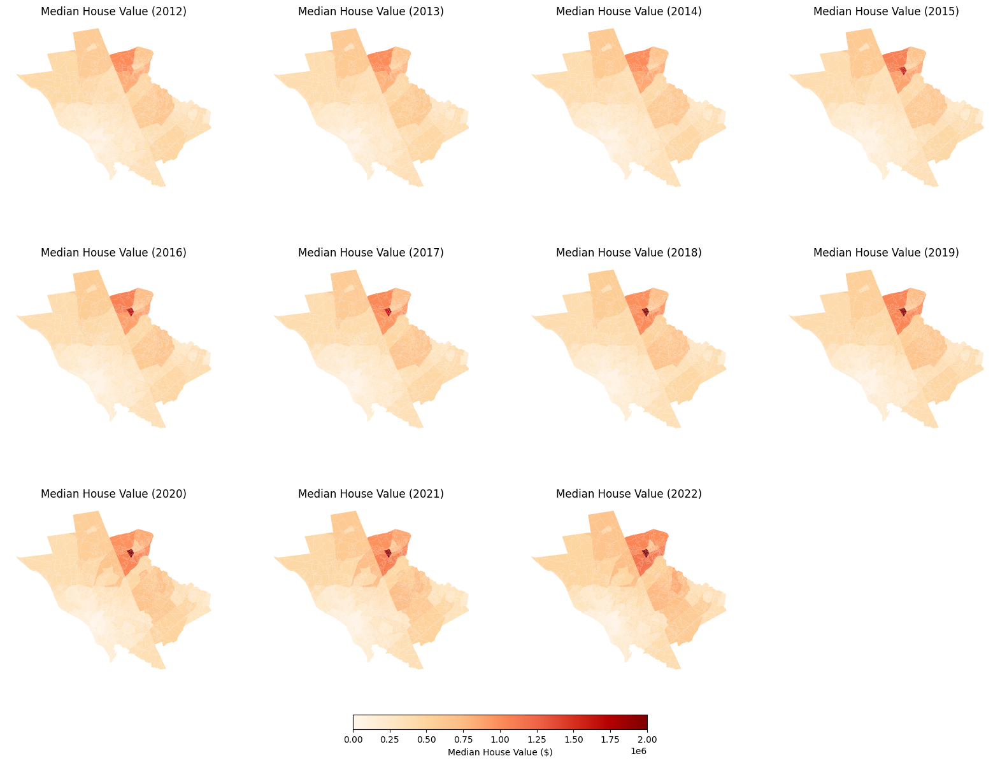

In [ ]:
#@title Median House Value (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Income_and_Value.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Median_House_Value_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")

# Define consistent color scale (vmin, vmax) and breaks
vmin = 0
vmax = gdf[house_value_columns].max().max()  # Maximum value from all years
bins = np.arange(vmin, vmax + 5000, 5000)  # Breaks every 5k

# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(years):
    ax = axes[i]
    column = f"Median_House_Value_{year}"
    gdf.plot(
        column=column,
        cmap="OrRd",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"Median House Value ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
fig.colorbar(
    plt.cm.ScalarMappable(cmap="OrRd", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="Median House Value ($)"
)

# Show the matrix of maps
plt.show()


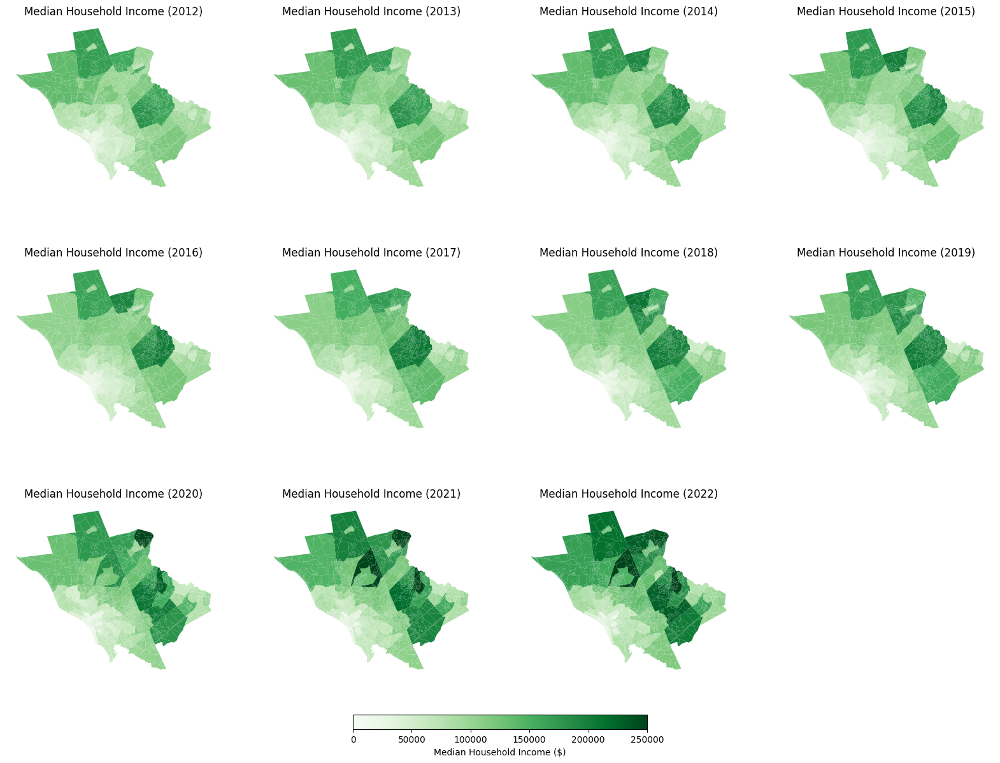

In [ ]:
#@title Median Household Income (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Income_and_Value.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Ensure all required columns exist in the GeoDataFrame
income_columns = [f"Median_Household_Income_{year}" for year in years]
missing_columns = [col for col in income_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")

# Define consistent color scale (vmin, vmax) and breaks
vmin = 0
vmax = gdf[income_columns].max().max()  # Maximum value from all years
bins = np.arange(vmin, vmax + 5000, 5000)  # Breaks every 5k

# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(years):
    ax = axes[i]
    column = f"Median_Household_Income_{year}"
    gdf.plot(
        column=column,
        cmap="Greens",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"Median Household Income ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
fig.colorbar(
    plt.cm.ScalarMappable(cmap="Greens", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="Median Household Income ($)"
)

# Show the matrix of maps
plt.show()


# Mapping Future (predicted) Data

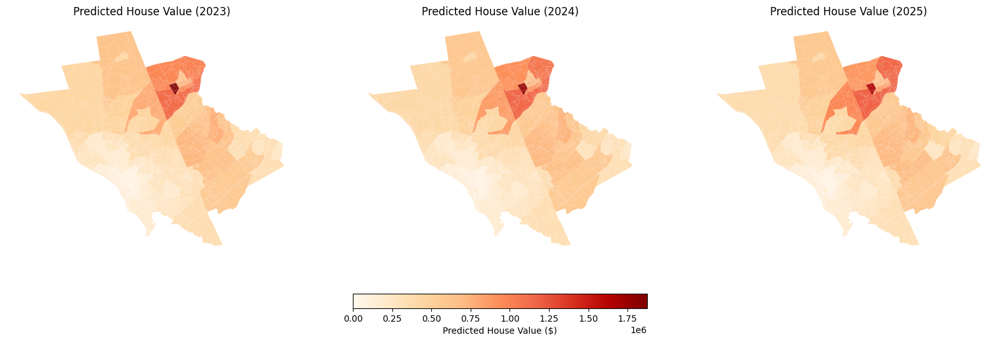

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value_Linear_Trend.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2023, 2026)  # 2023 to 2025

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Predicted_House_Value_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")

# Define consistent color scale (vmin, vmax) and breaks
vmin = 0
vmax = gdf[house_value_columns].max().max()  # Maximum from all columns
bins = np.arange(vmin, vmax + 5000, 5000)  # Breaks every 5k

# Create a figure with subplots (matrix of maps)
n_cols = 3  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(years):
    ax = axes[i]
    column = f"Predicted_House_Value_{year}"
    gdf.plot(
        column=column,
        cmap="OrRd",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"Predicted House Value ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
fig.colorbar(
    plt.cm.ScalarMappable(cmap="OrRd", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="Predicted House Value ($)"
)

# Show the matrix of maps
plt.show()

# Mapping Race Population

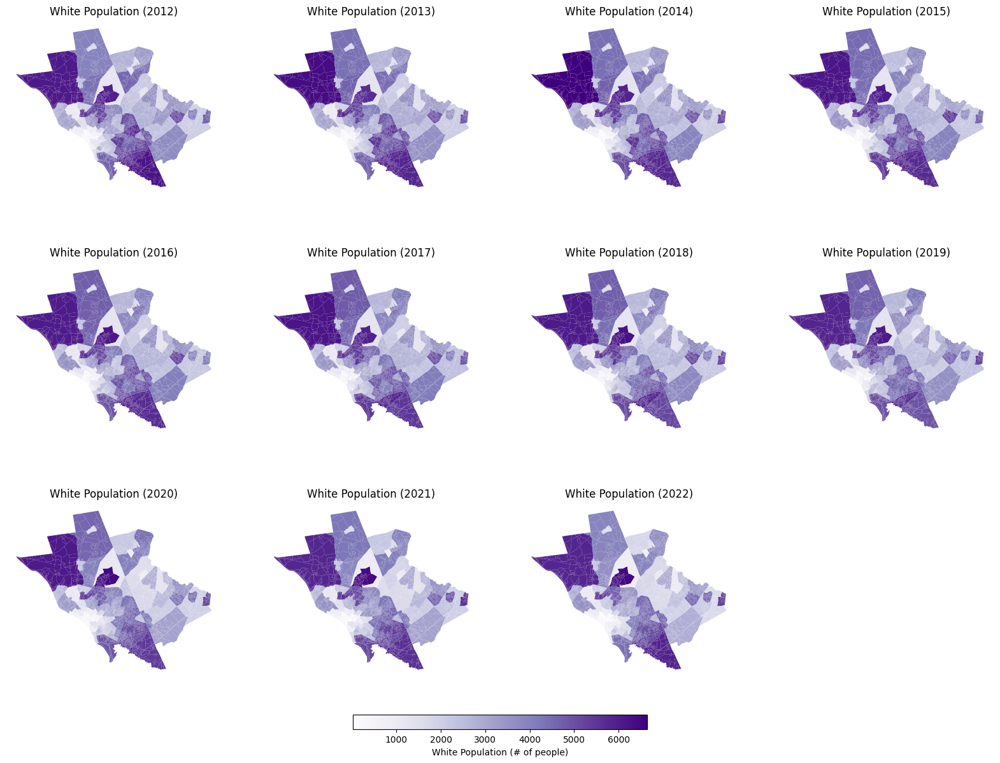

In [ ]:
#@title White Population (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_White_Population.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"White_Population_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")

# Define consistent color scale (vmin, vmax) and breaks
vmin = gdf[house_value_columns].min().min()  # Minimum from all columns
vmax = gdf[house_value_columns].max().max()  # Maximum from all columns
bins = np.arange(vmin, vmax + 5000, 5000)  # Breaks every 5k

# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(years):
    ax = axes[i]
    column = f"White_Population_{year}"
    gdf.plot(
        column=column,
        cmap="Purples",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"White Population ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
fig.colorbar(
    plt.cm.ScalarMappable(cmap="Purples", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="White Population (# of people)"
)

# Show the matrix of maps
plt.show()

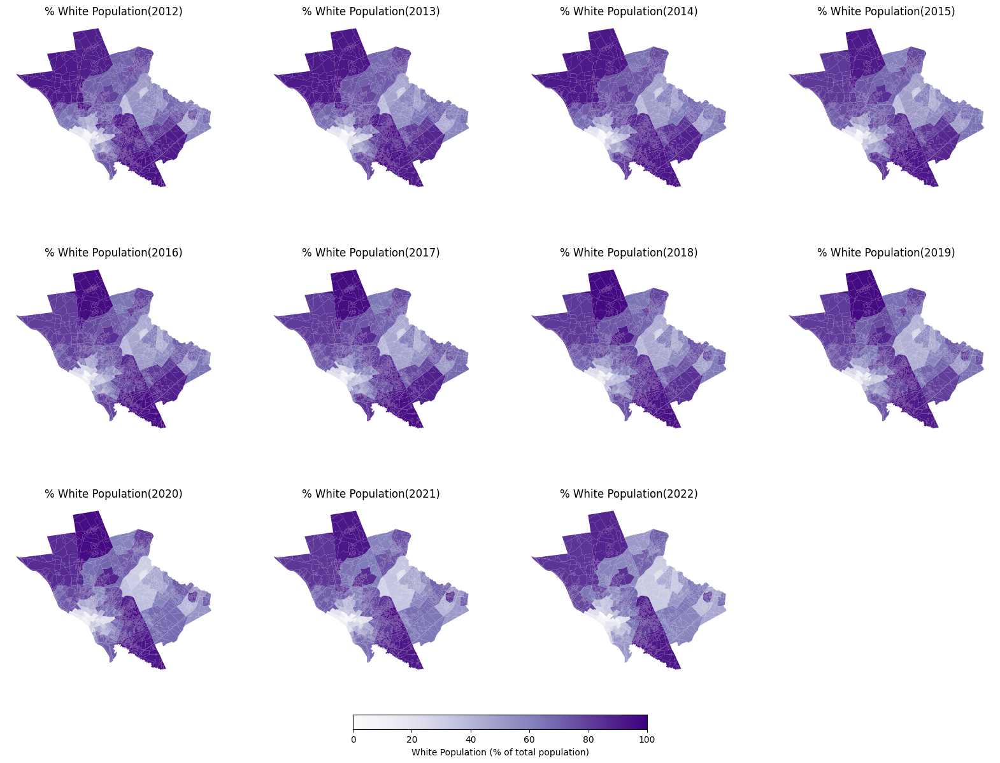

In [ ]:
#@title White Population as a Percentage of Total Population (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_White_Population_Percentage.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"White_Population_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")

# Scale the data from 0-1 to 0-100 for the relevant columns
for year in years:
    column_name = f"White_Population_{year}"
    gdf[column_name] = gdf[column_name] * 100  # Scale the values by 100

# Define consistent color scale (vmin, vmax)
vmin = 0  # Minimum
vmax = 100  # Maximum

# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(years):
    ax = axes[i]
    column = f"White_Population_{year}"
    gdf.plot(
        column=column,
        cmap="Purples",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"% White Population({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
fig.colorbar(
    plt.cm.ScalarMappable(cmap="Purples", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="White Population (% of total population)"
)

# Show the matrix of maps
plt.show()

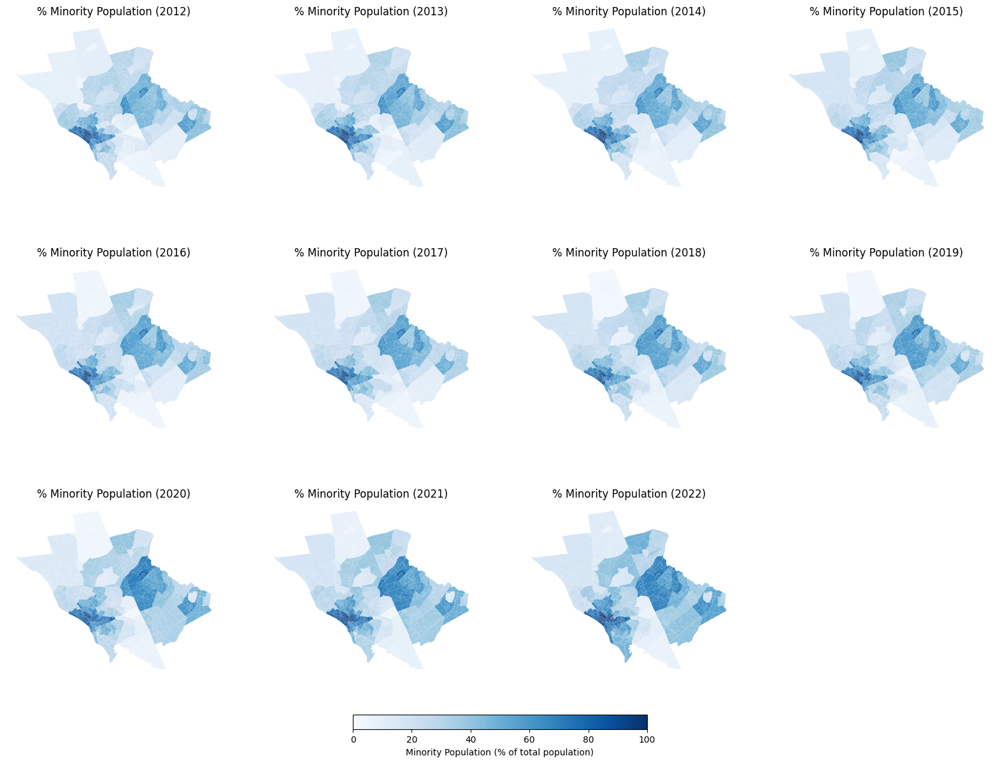

In [ ]:
#@title Minority Population as a Percentage of Total Population (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_White_Population_Percentage.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Calculate (total population - white population) for each year
for year in years:
    white_pop_column = f"White_Population_{year}"
    diff_column = f"Minority_Population_{year}"  # New column for the difference
    gdf[diff_column] = (1 - gdf[white_pop_column]) * 100


# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Minority_Population_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")

# Define consistent color scale (vmin, vmax) and breaks
vmin = 0  # Minimum from all columns
vmax = 100  # Maximum from all columns

# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(years):
    ax = axes[i]
    column = f"Minority_Population_{year}"
    gdf.plot(
        column=column,
        cmap="Blues",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"% Minority Population ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="Blues", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="Minority Population (% of total population)"
)

# Set custom tick locations for 0 and 100%
cbar.set_ticks([0, 20, 40, 60, 80, 100])


# Show the matrix of maps
plt.show()

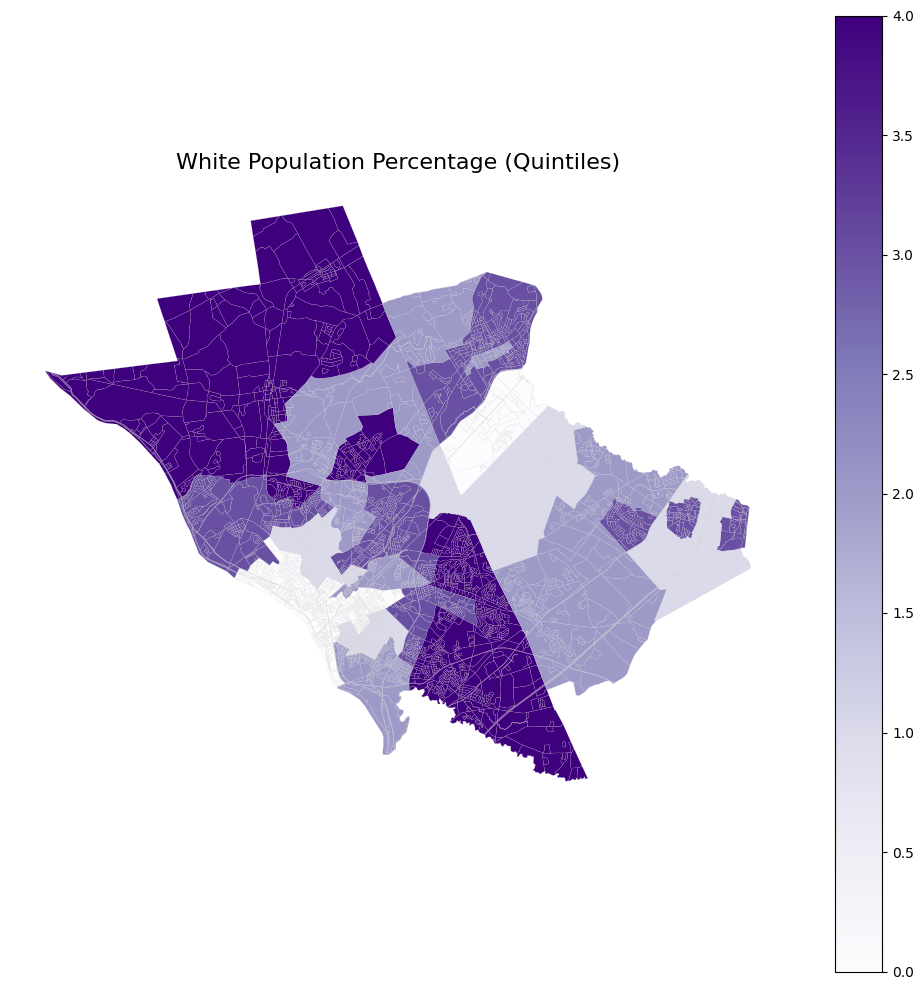

In [ ]:
#@title White Population Percentage in Quintiles (2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_White_Population_Percentage.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Choose the columns to visualize
pop_field = "White_Population_2022"

# Create quantile-based classification for both metrics
gdf['pop_quantiles'] = pd.qcut(gdf[pop_field], q=5, labels=False)

# Plot side-by-side maps
fig, ax = plt.subplots(1, 1, figsize=(10,10))

# Plot White Population Percentage
gdf.plot(
    column='pop_quantiles',
    cmap="Purples",
    linewidth=0.1,
    edgecolor="0.8",
    ax=ax,
    legend=True
)

ax.set_title("White Population Percentage (Quintiles)", fontsize=16)
ax.axis("off")

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


# Mapping Educational Attainment

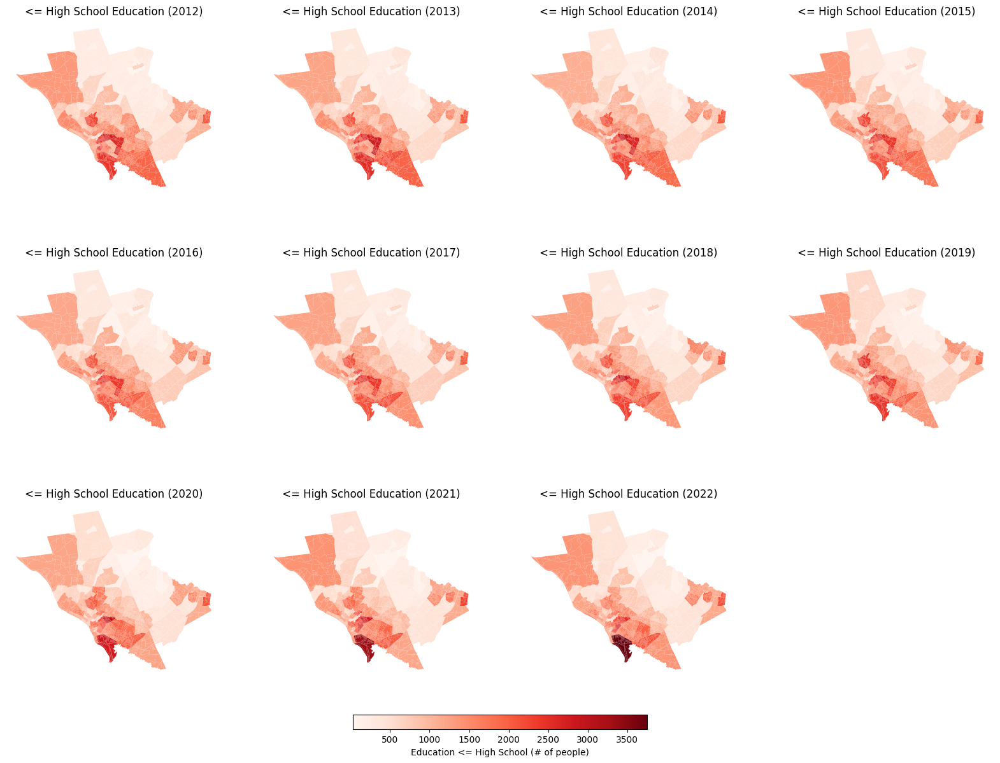

In [ ]:
#@title <= High School Educated (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Educational_Attainment.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Education columns to add together
edu_categories = [
    "NoEdu_Population", "NurseryEdu_Population", "KindergartenEdu_Population",
    "1stEdu_Population", "2ndEdu_Population", "3rdEdu_Population", "4thEdu_Population",
    "5thEdu_Population", "6thEdu_Population", "7thEdu_Population", "8thEdu_Population",
    "9thEdu_Population", "10thEdu_Population", "11thEdu_Population", "12thEdu_Population",
    "HighSchoolEdu_Population", "GEDEdu_Population"
]

# Create new columns for total population up to high school
total_columns = []
for year in years:
    cols_for_year = [f"{edu}_{year}" for edu in edu_categories]
    missing = [col for col in cols_for_year if col not in gdf.columns]
    if missing:
        print(f"Missing columns for {year}: {missing}")
        raise ValueError("Some columns are missing in the dataset.")

    total_col = f"Total_HS_or_below_{year}"
    gdf[total_col] = gdf[cols_for_year].sum(axis=1)
    total_columns.append(total_col)

# Define consistent color scale (vmin, vmax) and breaks
vmin = gdf[total_columns].min().min()  # Minimum from all columns
vmax = gdf[total_columns].max().max()  # Maximum from all columns
bins = np.arange(vmin, vmax + 5000, 5000)  # Breaks every 5k

# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(years):
    ax = axes[i]
    column = f"Total_HS_or_below_{year}"
    gdf.plot(
        column=column,
        cmap="Reds",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"<= High School Education ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
fig.colorbar(
    plt.cm.ScalarMappable(cmap="Reds", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="Education <= High School (# of people)"
)

# Show the matrix of maps
plt.show()

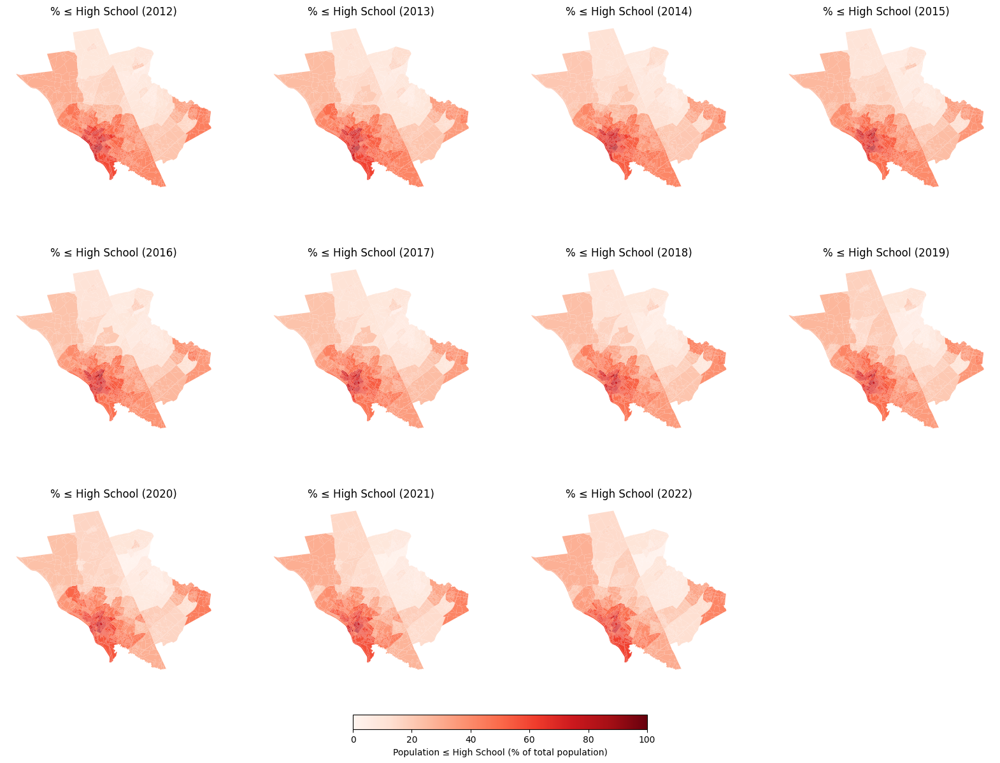

In [ ]:
#@title <= High School Educated as a Percentage of Total Population (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Educational_Attainment_Percentage.geojson"

# Load the GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Only include education categories up to High School
edu_categories = [
    "NoEdu_Population", "NurseryEdu_Population", "KindergartenEdu_Population",
    "1stEdu_Population", "2ndEdu_Population", "3rdEdu_Population", "4thEdu_Population",
    "5thEdu_Population", "6thEdu_Population", "7thEdu_Population", "8thEdu_Population",
    "9thEdu_Population", "10thEdu_Population", "11thEdu_Population", "12thEdu_Population",
    "HighSchoolEdu_Population", "GEDEdu_Population"
]

# Create new columns for total percentage ≤ High School (0–100 scale)
total_columns = []
for year in years:
    cols_for_year = [f"{edu}_{year}" for edu in edu_categories]
    missing = [col for col in cols_for_year if col not in gdf.columns]
    if missing:
        print(f"Missing columns for {year}: {missing}")
        raise ValueError("Some columns are missing in the dataset.")

    total_col = f"Total_HS_or_below_{year}"
    # sum 0-1 fractions, then convert to 0-100 scale
    gdf[total_col] = gdf[cols_for_year].sum(axis=1) * 100
    total_columns.append(total_col)

# Determine colormap limits based on actual data to show variation
vmin = 0
vmax = 100  # should now be <100

# Create subplots grid
n_cols = 4
n_rows = (len(years) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))
axes = axes.flatten()

# Plot each year
for i, year in enumerate(years):
    ax = axes[i]
    column = f"Total_HS_or_below_{year}"
    gdf.plot(
        column=column,
        cmap="Reds",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"% ≤ High School ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Shared colorbar
fig.colorbar(
    plt.cm.ScalarMappable(cmap="Reds", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="Population ≤ High School (% of total population)"
)

plt.show()



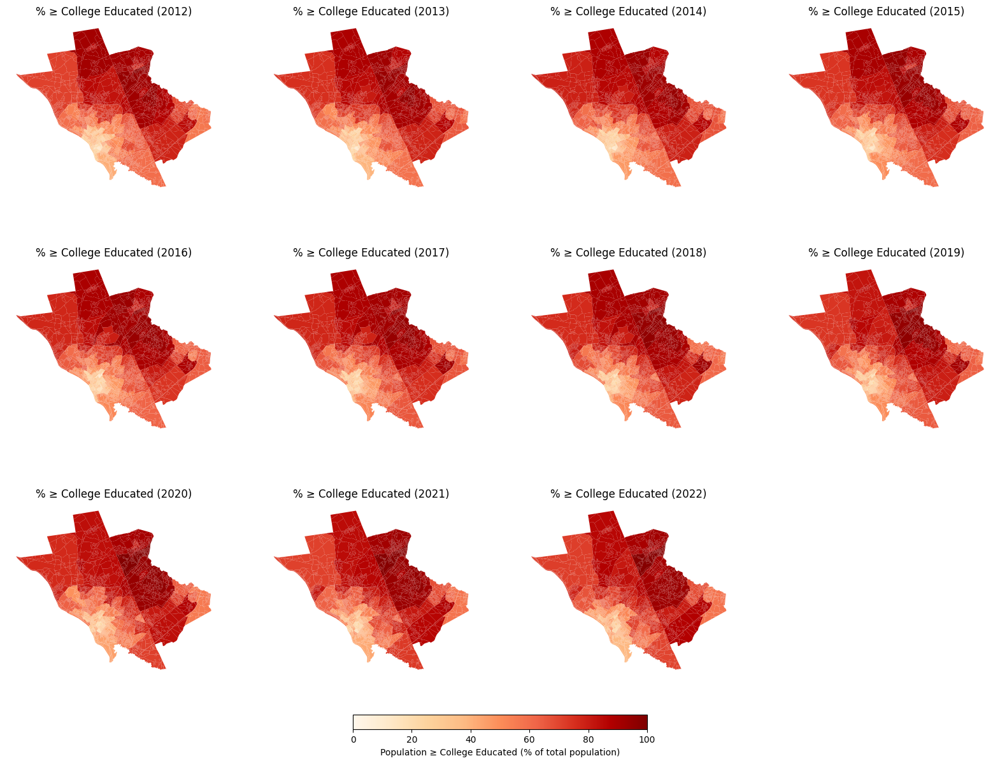

In [ ]:
#@title >= College Educated as a Percentage of Total Population (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Educational_Attainment_Percentage.geojson"

# Load the GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Only include education categories up to High School
edu_categories = [
    "NoEdu_Population", "NurseryEdu_Population", "KindergartenEdu_Population",
    "1stEdu_Population", "2ndEdu_Population", "3rdEdu_Population", "4thEdu_Population",
    "5thEdu_Population", "6thEdu_Population", "7thEdu_Population", "8thEdu_Population",
    "9thEdu_Population", "10thEdu_Population", "11thEdu_Population", "12thEdu_Population",
    "HighSchoolEdu_Population", "GEDEdu_Population"
]

# Create new columns for total percentage ≤ High School (0–100 scale)
total_columns = []
for year in years:
    cols_for_year = [f"{edu}_{year}" for edu in edu_categories]
    missing = [col for col in cols_for_year if col not in gdf.columns]
    if missing:
        print(f"Missing columns for {year}: {missing}")
        raise ValueError("Some columns are missing in the dataset.")

    total_col = f"Total_HS_or_below_{year}"
    # sum 0-1 fractions, then convert to 0-100 scale
    gdf[total_col] = gdf[cols_for_year].sum(axis=1) * 100

    diff_column = f"Total_College_or_above_{year}"  # New column for the difference
    gdf[diff_column] = 100 - gdf[total_col]

    total_columns.append(diff_column)

# Determine colormap limits based on actual data to show variation
vmin = 0
vmax = 100  # should now be <100

# Create subplots grid
n_cols = 4
n_rows = (len(years) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))
axes = axes.flatten()

# Plot each year
for i, year in enumerate(years):
    ax = axes[i]
    column = f"Total_College_or_above_{year}"
    gdf.plot(
        column=column,
        cmap="OrRd",
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,
        vmin=vmin,
        vmax=vmax
    )
    ax.set_title(f"% ≥ College Educated ({year})", fontsize=12)
    ax.axis("off")

# Turn off unused subplots
for i in range(len(years), len(axes)):
    axes[i].axis("off")

# Shared colorbar
fig.colorbar(
    plt.cm.ScalarMappable(cmap="OrRd", norm=plt.Normalize(vmin=vmin, vmax=vmax)),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    pad=0.05,
    label="Population ≥ College Educated (% of total population)"
)

plt.show()


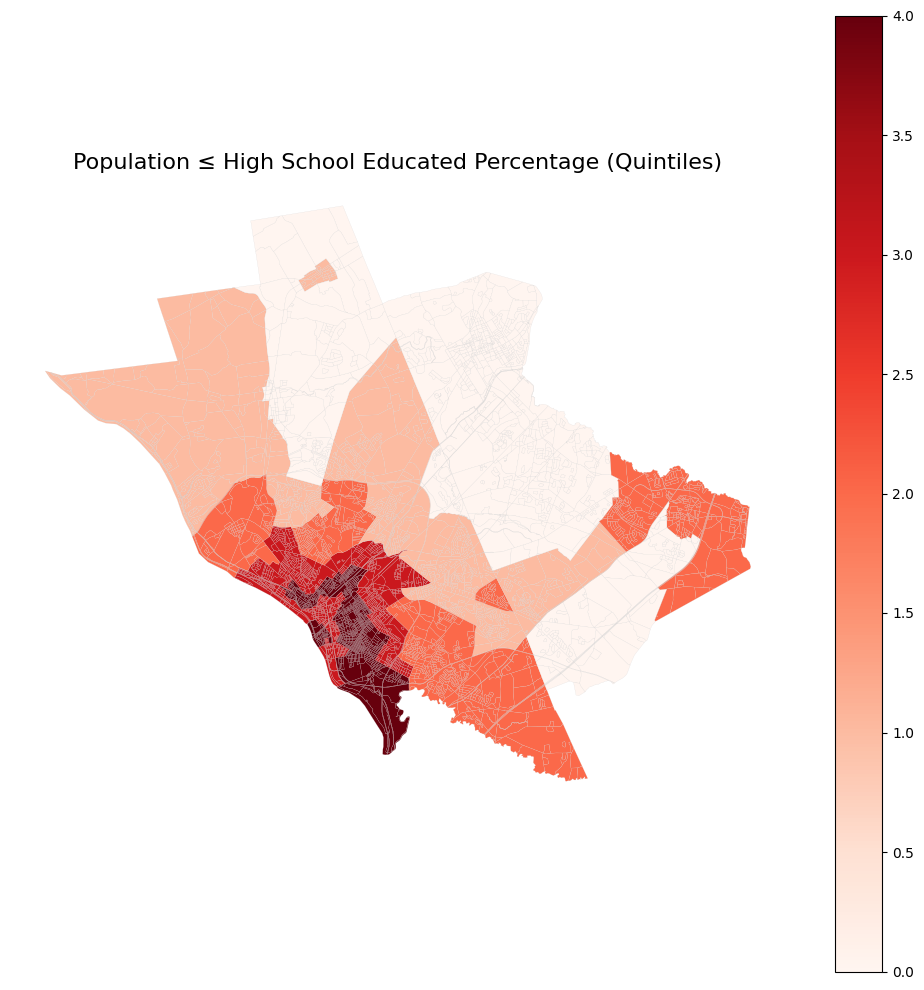

In [ ]:
#@title <= High School Educated Percentage in Quintiles (2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Educational_Attainment_Percentage.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Choose the columns to visualize

# Education columns to add together
edu_categories = [
    "NoEdu_Population", "NurseryEdu_Population", "KindergartenEdu_Population",
    "1stEdu_Population", "2ndEdu_Population", "3rdEdu_Population", "4thEdu_Population",
    "5thEdu_Population", "6thEdu_Population", "7thEdu_Population", "8thEdu_Population",
    "9thEdu_Population", "10thEdu_Population", "11thEdu_Population", "12thEdu_Population",
    "HighSchoolEdu_Population", "GEDEdu_Population"
]

# Create new columns for total population up to high school
cols = [f"{edu}_2022" for edu in edu_categories]

total_col = f"Total_HS_or_below_2022"
gdf[total_col] = gdf[cols].sum(axis=1)

# Create quantile-based classification for both metrics
gdf['pop_quantiles'] = pd.qcut(gdf[total_col], q=5, labels=False)

# Plot side-by-side maps
fig, ax = plt.subplots(1, 1, figsize=(10,10))

# Plot <= HS Educational Attainment
gdf.plot(
    column='pop_quantiles',
    cmap="Reds",
    linewidth=0.1,
    edgecolor="0.8",
    ax=ax,
    legend=True
)

ax.set_title("Population ≤ High School Educated Percentage (Quintiles)", fontsize=16)
ax.axis("off")

# Adjust layout
plt.tight_layout()

# Show the plots
plt.show()


# Mapping Price Variation

## Current Data

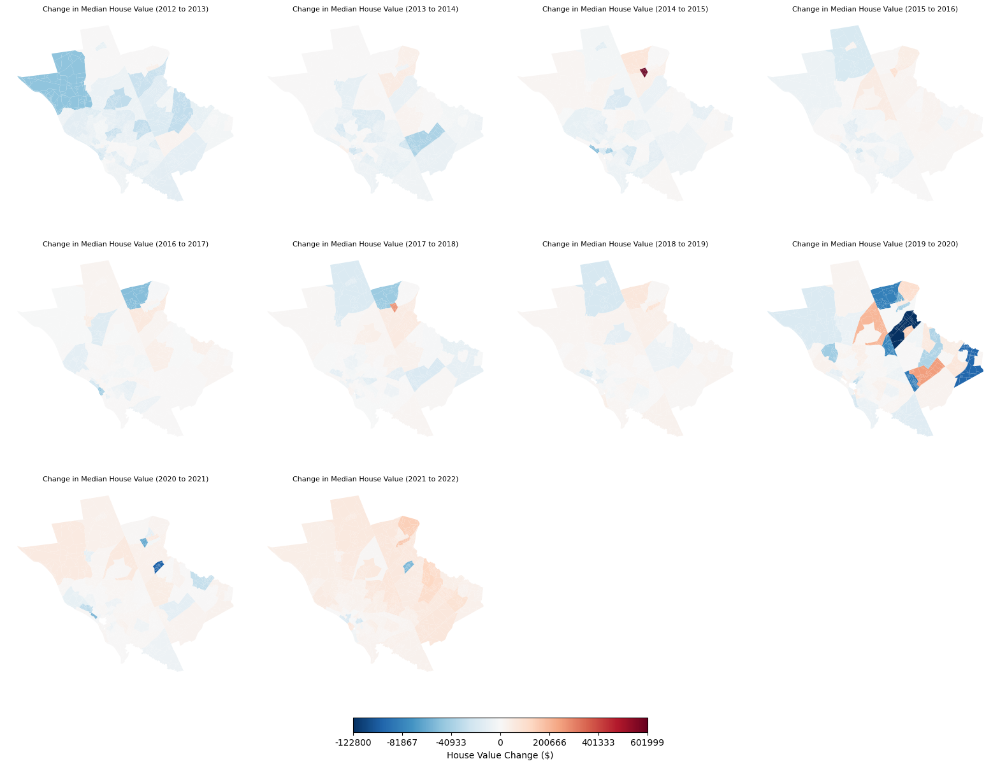

In [ ]:
#@title Change in Median House Value Between Years ($) (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker


# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Income_and_Value.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Median_House_Value_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Calculate the change in house value between each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Change_{current_year}"  # New column for change
    gdf[column_name] = gdf[f"Median_House_Value_{current_year}"] - gdf[f"Median_House_Value_{previous_year}"]

# Columns to visualize (change in value)
change_columns = [f"House_Value_Change_{year}" for year in range(2013, 2023)]

# Define consistent color scale (vmin, vmax)
vmin = gdf[change_columns].min().min()  # Minimum change
vmax = gdf[change_columns].max().max()  # Maximum change

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2013, 2023)):  # Start from 2013
    ax = axes[i]
    column = f"House_Value_Change_{year}"
    gdf.plot(
        column=column,
        cmap="RdBu_r",  # Diverging colormap for change
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm # Apply the centered normalization
    )
    ax.set_title(f"Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change ($)",
    location="bottom",  # Change location to avoid overlap
)


# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(vmin)
pos_range = abs(vmax)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])


# Show the matrix of maps
plt.show()


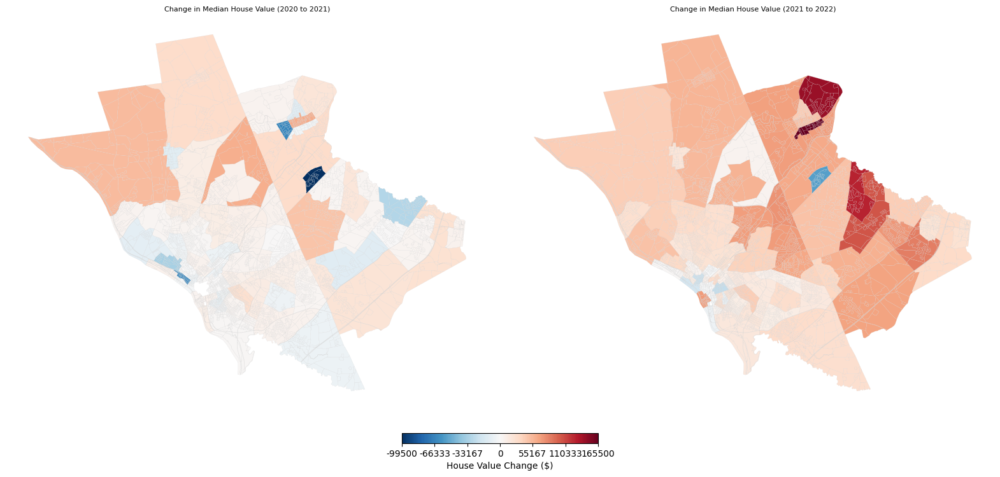

In [ ]:
#@title Change in Median House Value Between Years ($) (2020-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker


# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Income_and_Value.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Define the range of years
years = range(2020, 2023)  # 2020 to 2022

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Median_House_Value_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Calculate the change in house value between each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Change_{current_year}"  # New column for change
    gdf[column_name] = gdf[f"Median_House_Value_{current_year}"] - gdf[f"Median_House_Value_{previous_year}"]

# Columns to visualize (change in value)
change_columns = [f"House_Value_Change_{year}" for year in range(2021, 2023)]

# Define consistent color scale (vmin, vmax)
vmin = gdf[change_columns].min().min()  # Minimum change
vmax = gdf[change_columns].max().max()  # Maximum change

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 2  # Number of columns in the grid
n_rows = (len(change_columns) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2021, 2023)):  # Start from 2013
    ax = axes[i]
    column = f"House_Value_Change_{year}"
    gdf.plot(
        column=column,
        cmap="RdBu_r",  # Diverging colormap for change
        linewidth=0.1,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm # Apply the centered normalization
    )
    ax.set_title(f"Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change ($)"
)

# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(vmin)
pos_range = abs(vmax)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])

# Show the matrix of maps
plt.show()


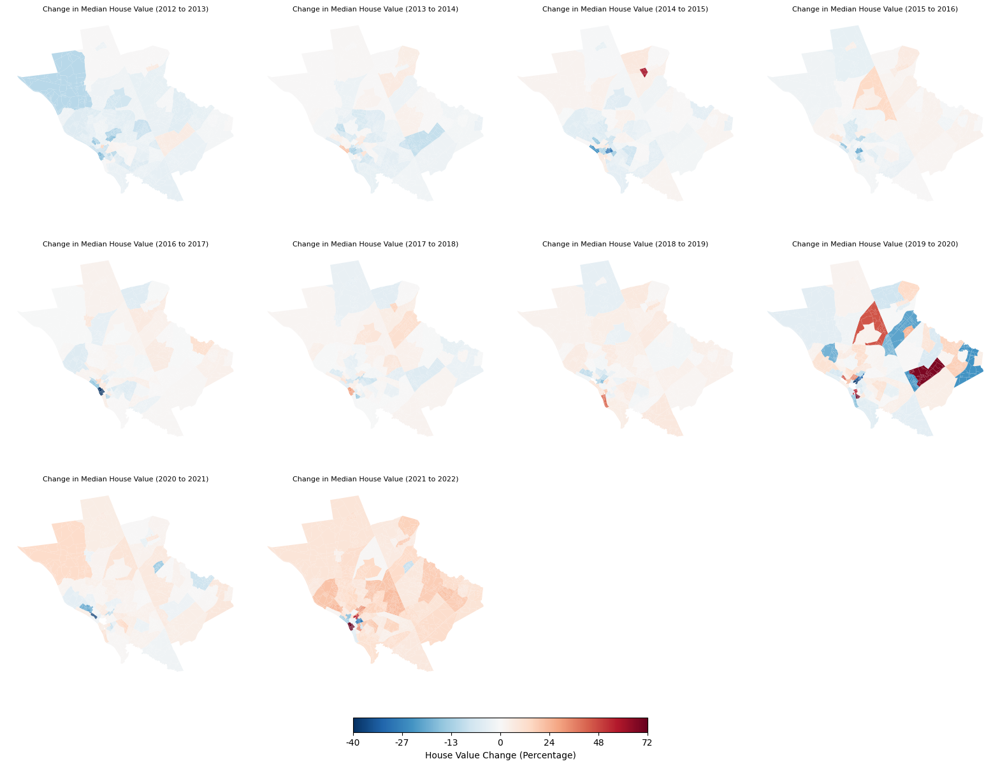

In [ ]:
#@title Percent Change in Median House Value Between Years (Percentage) (2012-2022)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker


# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Income_and_Value.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Define the range of years
years = range(2012, 2023)  # 2012 to 2022

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Median_House_Value_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Calculate the change in house value between each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Change_{current_year}"  # New column for change
    gdf[column_name] = (gdf[f"Median_House_Value_{current_year}"] - gdf[f"Median_House_Value_{previous_year}"]) / gdf[f"Median_House_Value_{previous_year}"] * 100

# Columns to visualize (change in value)
change_columns = [f"House_Value_Change_{year}" for year in range(2013, 2023)]

# Define consistent color scale (vmin, vmax)
vmin = gdf[change_columns].min().min()  # Minimum change
vmax = gdf[change_columns].max().max()  # Maximum change

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 4  # Number of columns in the grid
n_rows = (len(change_columns) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2013, 2023)):  # Start from 2013
    ax = axes[i]
    column = f"House_Value_Change_{year}"
    gdf.plot(
        column=column,
        cmap="RdBu_r",  # Diverging colormap for change
        linewidth=0,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm # Apply the centered normalization
    )
    ax.set_title(f"Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change (Percentage)",
    location="bottom",  # Change location to avoid overlap
)

# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(vmin)
pos_range = abs(vmax)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])

# Show the matrix of maps
plt.show()


## Future Data

In [ ]:
#@title Change in Median House Value Between Years ($) (2023-2025)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker


# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value.geojson"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Define the range of years
years = range(2023, 2026)  # 2023 to 2026

# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Predicted_House_Value_{year}" for year in years]
missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Calculate the change in house value between each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Change_{current_year}"  # New column for change
    gdf[column_name] = gdf[f"Predicted_House_Value_{current_year}"] - gdf[f"Predicted_House_Value_{previous_year}"]

# Columns to visualize (change in value)
change_columns = [f"House_Value_Change_{year}" for year in range(2024, 2026)]

# Define consistent color scale (vmin, vmax)
vmin = gdf[change_columns].min().min()  # Minimum change
vmax = gdf[change_columns].max().max()  # Maximum change

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 2  # Number of columns in the grid
n_rows = (len(change_columns) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2024, 2026)):  # Start from 2024
    ax = axes[i]
    column = f"House_Value_Change_{year}"
    gdf.plot(
        column=column,
        cmap="RdBu_r",  # Diverging colormap for change
        linewidth=0.1,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm # Apply the centered normalization
    )
    ax.set_title(f"Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change ($)"
)

# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(vmin)
pos_range = abs(vmax)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])

# Show the matrix of maps
plt.show()


KeyboardInterrupt: 

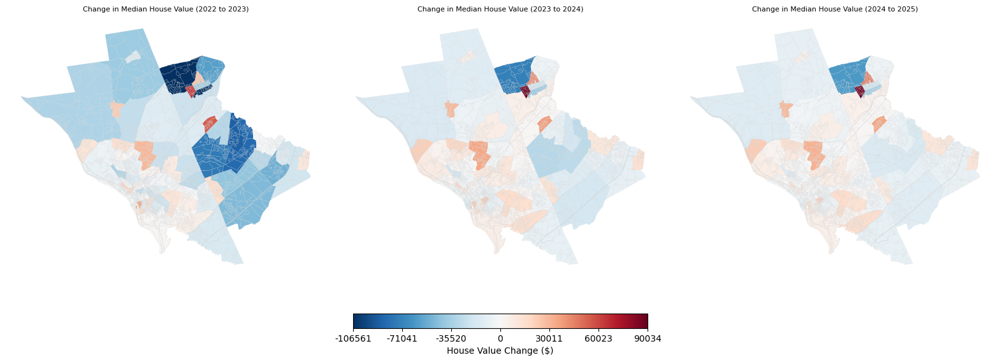

In [ ]:
#@title Change in Median House Value Between Years ($) (2022-2025)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import pandas as pd



# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value.geojson"
csv_path = dir + "median_household_income_and_median_house_value.csv"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)
data = pd.read_csv(csv_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Convert Unique_ID to string in both gdf and data
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf = gdf.merge(data[['Unique_ID', 'Median_House_Value_2022']], on='Unique_ID', how='left')
gdf['House_Value_Change_2023'] = gdf['Predicted_House_Value_2023'] - gdf['Median_House_Value_2022']


# Define the range of years
years = range(2023, 2026)  # 2023 to 2025


# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Predicted_House_Value_{year}" for year in years]
change_columns = [f"House_Value_Change_{year}" for year in range(2023, 2026)]  # Include 2023

missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Calculate the change in house value between each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Change_{current_year}"  # New column for change
    gdf[column_name] = gdf[f"Predicted_House_Value_{current_year}"] - gdf[f"Predicted_House_Value_{previous_year}"]

# Define consistent color scale (vmin, vmax)
vmin = gdf[change_columns].min().min()  # Minimum change
vmax = gdf[change_columns].max().max()  # Maximum change

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 3  # Number of columns in the grid
n_rows = (len(change_columns) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2023, 2026)):  # Start from 2024
    ax = axes[i]
    column = f"House_Value_Change_{year}"
    gdf.plot(
        column=column,
        cmap="RdBu_r",  # Diverging colormap for change
        linewidth=0.1,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm # Apply the centered normalization
    )
    ax.set_title(f"Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change ($)"
)

# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(vmin)
pos_range = abs(vmax)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])

# Show the matrix of maps
plt.show()


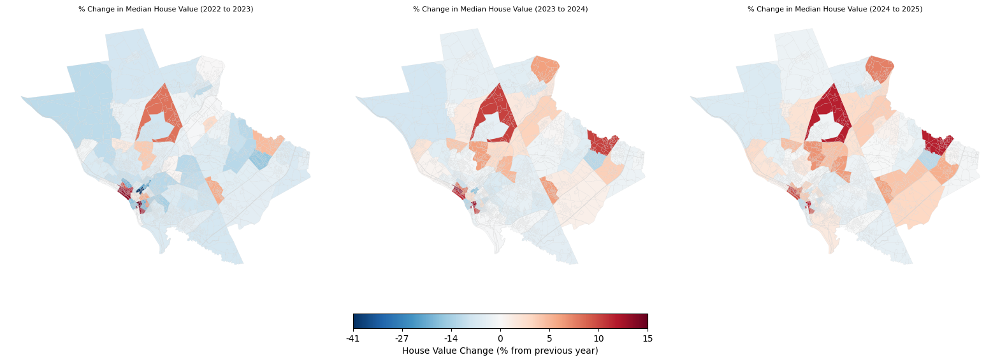

In [ ]:
#@title Percent Change in Median House Value Between Years (Percentage) (2022-2025)

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import pandas as pd



# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value_Linear_Trend.geojson"
csv_path = dir + "median_household_income_and_median_house_value.csv"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)
data = pd.read_csv(csv_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Convert Unique_ID to string in both gdf and data
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf = gdf.merge(data[['Unique_ID', 'Median_House_Value_2022']], on='Unique_ID', how='left')
gdf['House_Value_Percent_Change_2023'] = (gdf['Predicted_House_Value_2023'] - gdf['Median_House_Value_2022']) / gdf['Median_House_Value_2022'] * 100


# Define the range of years
years = range(2023, 2026)  # 2023 to 2025


# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Predicted_House_Value_{year}" for year in years]

missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Compute percentage change in house values for each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Percent_Change_{current_year}"
    gdf[column_name] = ((gdf[f"Predicted_House_Value_{current_year}"] - gdf[f"Predicted_House_Value_{previous_year}"]) / gdf[f"Predicted_House_Value_{previous_year}"]) * 100

# Columns to visualize (percentage change)
percent_change_columns = [f"House_Value_Percent_Change_{year}" for year in range(2023, 2026)]

# Define consistent color scale (vmin, vmax) and breaks for percentage change
vmin = gdf[percent_change_columns].min().min()
vmax = gdf[percent_change_columns].max().max()

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 3  # Number of columns in the grid
n_rows = (len(percent_change_columns) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2023, 2026)):  # Start from 2024
    ax = axes[i]
    column = f"House_Value_Percent_Change_{year}"
    gdf.plot(
        column=column,
        cmap="RdBu_r",  # Diverging colormap for change
        linewidth=0.1,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm # Apply the centered normalization
    )
    ax.set_title(f"% Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(percent_change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change (% from previous year)"
    #location="bottom",  # Change location to avoid overlap
)

# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(vmin)
pos_range = abs(vmax)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])

# Show the matrix of maps
plt.show()


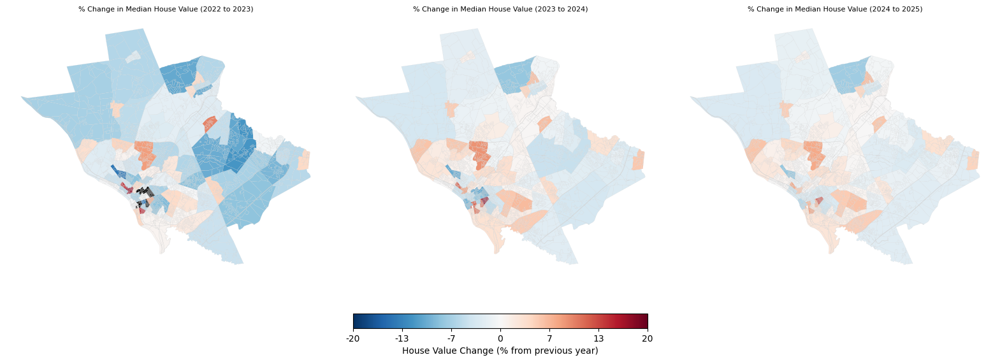

In [ ]:
#@title Percent Change in Median House Value Between Years Excluding Outliers (Percentage) (2022-2025)

"""
There is only one instance where the predicted change in median house value was
greater than 20%. Consequently, the minimum and maximum was set to -20 and 20
in order to remove the outlier (of around 100%) and make the rest of the map
more readable.

The outlier is shaded in black rather than red or blue.
"""


import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import pandas as pd



# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value.geojson"
csv_path = dir + "median_household_income_and_median_house_value.csv"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)
data = pd.read_csv(csv_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Convert Unique_ID to string in both gdf and data
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf = gdf.merge(data[['Unique_ID', 'Median_House_Value_2022']], on='Unique_ID', how='left')
gdf['House_Value_Percent_Change_2023'] = (gdf['Predicted_House_Value_2023'] - gdf['Median_House_Value_2022']) / gdf['Median_House_Value_2022'] * 100


# Define the range of years
years = range(2023, 2026)  # 2023 to 2025


# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Predicted_House_Value_{year}" for year in years]

missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Compute percentage change in house values for each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Percent_Change_{current_year}"
    gdf[column_name] = ((gdf[f"Predicted_House_Value_{current_year}"] - gdf[f"Predicted_House_Value_{previous_year}"]) / gdf[f"Predicted_House_Value_{previous_year}"]) * 100

# Columns to visualize (percentage change)
percent_change_columns = [f"House_Value_Percent_Change_{year}" for year in range(2023, 2026)]

# Define consistent color scale (vmin, vmax)
# Limiting percentage change to only between -20 and 20 rather than the min and max
vmin = -20
vmax = 20

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 3  # Number of columns in the grid
n_rows = 1  #(len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2023, 2026)):  # Start from 2024
    ax = axes[i]
    column = f"House_Value_Percent_Change_{year}"

    # Create a custom colormap with black for values outside the range of (-20, 20)
    cmap = plt.cm.RdBu_r
    cmap_modified = colors.ListedColormap(cmap(np.linspace(0, 1, cmap.N)))
    cmap_modified.set_under('black')
    cmap_modified.set_over('black')


    gdf.plot(
        column=column,
        cmap=cmap_modified,  # Diverging colormap for change
        linewidth=0.1,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm, # Apply the centered normalization
    )
    ax.set_title(f"% Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change (% from previous year)"
    #location="bottom",  # Change location to avoid overlap
)

#cbar.ax.set_position([0.3, 0.05, 0.4, 0.02])

# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(-20)
pos_range = abs(20)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])

# Show the matrix of maps
plt.show()


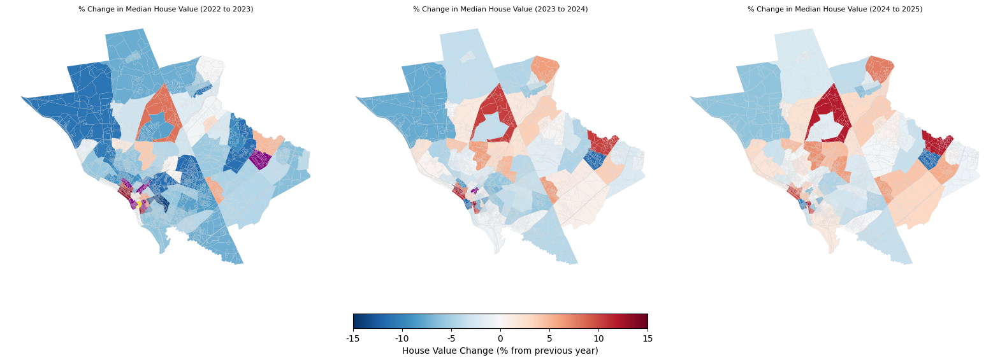

In [ ]:
#@title Percent Change in Median House Value Between Years Excluding Outliers (Percentage) (2022-2025)

"""
There is only one instance where the predicted change in median house value was
greater than 20%. Consequently, the minimum and maximum was set to -20 and 20
in order to remove the outlier (of around 100%) and make the rest of the map
more readable.

The outlier is shaded in black rather than red or blue.
"""


import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import pandas as pd



# File path to the merged GeoJSON file
merged_geojson_path = dir + "Mercer_County_Census_Tracts_with_Future_House_Value_Linear_Trend.geojson"
csv_path = dir + "median_household_income_and_median_house_value.csv"

# Load the merged GeoJSON
gdf = gpd.read_file(merged_geojson_path)
data = pd.read_csv(csv_path)

# Replace -666666666 with NA
gdf = gdf.replace(-666666666, np.nan)

# Convert Unique_ID to string in both gdf and data
gdf['Unique_ID'] = gdf['Unique_ID'].astype(str)
data['Unique_ID'] = data['Unique_ID'].astype(str)
gdf = gdf.merge(data[['Unique_ID', 'Median_House_Value_2022']], on='Unique_ID', how='left')
gdf['House_Value_Percent_Change_2023'] = (gdf['Predicted_House_Value_2023'] - gdf['Median_House_Value_2022']) / gdf['Median_House_Value_2022'] * 100


# Define the range of years
years = range(2023, 2026)  # 2023 to 2025


# Ensure all required columns exist in the GeoDataFrame
house_value_columns = [f"Predicted_House_Value_{year}" for year in years]

missing_columns = [col for col in house_value_columns if col not in gdf.columns]
if missing_columns:
    print(f"Missing columns: {missing_columns}")
    raise ValueError("The above columns are missing from the data.")



# Compute percentage change in house values for each year
for i in range(len(years) - 1):
    current_year = years[i + 1]
    previous_year = years[i]
    column_name = f"House_Value_Percent_Change_{current_year}"
    gdf[column_name] = ((gdf[f"Predicted_House_Value_{current_year}"] - gdf[f"Predicted_House_Value_{previous_year}"]) / gdf[f"Predicted_House_Value_{previous_year}"]) * 100

# Columns to visualize (percentage change)
percent_change_columns = [f"House_Value_Percent_Change_{year}" for year in range(2023, 2026)]

# Define consistent color scale (vmin, vmax)
# Limiting percentage change to only between -20 and 20 rather than the min and max
vmin = -15
vmax = 15

# Center color scale around 0 using TwoSlopeNorm
divnorm = colors.TwoSlopeNorm(vmin=vmin, vcenter=0, vmax=vmax)


# Create a figure with subplots (matrix of maps)
n_cols = 3  # Number of columns in the grid
n_rows = 1  #(len(years) + n_cols - 1) // n_cols  # Calculate number of rows needed
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

# Flatten axes for easier iteration
axes = axes.flatten()

# Plot each year's data on a separate map
for i, year in enumerate(range(2023, 2026)):  # Start from 2024
    ax = axes[i]
    column = f"House_Value_Percent_Change_{year}"

    # Create a custom colormap with black for values outside the range of (-20, 20)
    cmap = plt.cm.RdBu_r
    cmap_modified = colors.ListedColormap(cmap(np.linspace(0, 1, cmap.N)))
    cmap_modified.set_under('purple')
    cmap_modified.set_over('gold')


    gdf.plot(
        column=column,
        cmap=cmap_modified,  # Diverging colormap for change
        linewidth=0.1,
        edgecolor="0.8",
        ax=ax,
        legend=False,  # Suppress individual legends
        norm = divnorm, # Apply the centered normalization
    )
    ax.set_title(f"% Change in Median House Value ({year -1} to {year})", fontsize=8)  # Updated title
    ax.axis("off")


plt.subplots_adjust(wspace=0.05, hspace=0.1) # Adjust wspace and hspace values as needed

# Turn off unused subplots
for i in range(len(percent_change_columns), len(axes)):
    axes[i].axis("off")

# Add a single, shared legend
cbar = fig.colorbar(
    plt.cm.ScalarMappable(cmap="RdBu_r", norm=divnorm),
    ax=axes,
    orientation="horizontal",
    fraction=0.02,
    shrink = 0.6,
    pad=0.05,
    label="House Value Change (% from previous year)"
    #location="bottom",  # Change location to avoid overlap
)

#cbar.ax.set_position([0.3, 0.05, 0.4, 0.02])

# Force tick locations and labels to include negative values and 0
# Calculate the absolute range for negative and positive values
neg_range = abs(-20)
pos_range = abs(20)

# Create tick values for negative, 0, and positive ranges
num_ticks = 7  # Total number of ticks (including 0)
neg_ticks = np.linspace(vmin, 0, int(num_ticks / 2) + 1)[:-1]  # Exclude 0
pos_ticks = np.linspace(0, vmax, int(num_ticks / 2) + 1)
tick_values = np.concatenate([neg_ticks, pos_ticks])

cbar.set_ticks(tick_values)
cbar.set_ticklabels([f"{val:.0f}" for val in tick_values])

# Show the matrix of maps
plt.show()


In [ ]:
import matplotlib
print(matplotlib.colors.CSS4_COLORS.keys())


dict_keys(['aliceblue', 'antiquewhite', 'aqua', 'aquamarine', 'azure', 'beige', 'bisque', 'black', 'blanchedalmond', 'blue', 'blueviolet', 'brown', 'burlywood', 'cadetblue', 'chartreuse', 'chocolate', 'coral', 'cornflowerblue', 'cornsilk', 'crimson', 'cyan', 'darkblue', 'darkcyan', 'darkgoldenrod', 'darkgray', 'darkgreen', 'darkgrey', 'darkkhaki', 'darkmagenta', 'darkolivegreen', 'darkorange', 'darkorchid', 'darkred', 'darksalmon', 'darkseagreen', 'darkslateblue', 'darkslategray', 'darkslategrey', 'darkturquoise', 'darkviolet', 'deeppink', 'deepskyblue', 'dimgray', 'dimgrey', 'dodgerblue', 'firebrick', 'floralwhite', 'forestgreen', 'fuchsia', 'gainsboro', 'ghostwhite', 'gold', 'goldenrod', 'gray', 'green', 'greenyellow', 'grey', 'honeydew', 'hotpink', 'indianred', 'indigo', 'ivory', 'khaki', 'lavender', 'lavenderblush', 'lawngreen', 'lemonchiffon', 'lightblue', 'lightcoral', 'lightcyan', 'lightgoldenrodyellow', 'lightgray', 'lightgreen', 'lightgrey', 'lightpink', 'lightsalmon', 'lights